# HiRES 数据 Seurat 对象构建与多模态数据整合

本笔记本用于构建HiRES小鼠胚胎发育数据的完整Seurat对象，整合多种数据类型。主要功能包括：

## 主要功能
- **RNA-seq数据处理**: 合并胚胎发育和器官发生阶段的RNA表达数据
- **CpG甲基化数据整合**: 处理全基因组甲基化数据并进行归一化
- **Hi-C接触衰减谱分析**: 添加染色质接触衰减特征(CDPS)
- **细胞周期特征**: 整合DNA和RNA水平的细胞周期评分
- **多维度降维分析**: 基于不同数据类型的PCA和UMAP分析
- **细胞类型注释**: 基于聚类结果进行细胞类型标注

## 数据输出
- 完整的多模态Seurat对象 (`hires_mouse_emb_dev.mres.rds`)
- 质控通过的细胞元数据 (`metadata_qcpass.tsv`)
- 各类特征的可视化结果

此对象将用于后续的细胞发育轨迹分析、细胞类型特异性分析等研究。

---

# Generat Seurat object for hires main dataset

@author zliu 20220324

## 加载必需的 R 包和依赖库

In [ ]:
# 加载数据处理和可视化所需的R包
library(tidyverse)      # 数据操作和处理
library(Seurat)         # 单细胞数据分析主要工具包
library(patchwork)      # 图形组合和布局
# 加载自定义的绘图和工具函数
source("../hires_gastrulation/CHARMtools/Rlibs/plotFun.R")
source("../hires_gastrulation/CHARMtools/Rlibs/hires_utils.R")
library(ggpubr)         # 发表级图形美化
library(plotly)         # 交互式图形
library(Matrix)         # 稀疏矩阵处理
library(ComplexHeatmap) # 复杂热图绘制

## RNA 和 CpG 甲基化数据整合处理

In [ ]:
# 读取并合并RNA表达矩阵数据
# 读取胚胎发育阶段(gastrulation)的RNA表达数据
gastrulationRNA_raw <- read_table2("/shareb//zliu//analysis/hires_gastrulation/Data/result/RNA_Res/counts.gene.total.format.tsv")
# 读取器官发生阶段(organogenesis)的RNA表达数据
organogenesisRNA_raw <- read_table2("/shareb//zliu//analysis/hires_organogenesis/Data/result/RNA_Res/counts.gene.total.format.tsv")
# 使用全连接(full_join)合并两个发育阶段的RNA数据，确保包含所有基因和细胞
RNA_mat <- gastrulationRNA_raw %>% full_join(organogenesisRNA_raw)
# 将合并后矩阵中的缺失值(NA)填充为0，表示该基因在对应细胞中无表达
RNA_mat[is.na(RNA_mat)] <- 0

Warning message:
“`read_table2()` was deprecated in readr 2.0.0.
Please use `read_table()` instead.”

── Column specification ─────────────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  .default = col_double(),
  gene = col_character()
)
ℹ Use `spec()` for the full column specifications.

Warning message:
“`read_table2()` was deprecated in readr 2.0.0.
Please use `read_table()` instead.”

── Column specification ─────────────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  .default = col_double(),
  gene = col_character()
)
ℹ Use `spec()` for the full column specifications.

Joining, by = "gene"


In [ ]:
# 读取并合并细胞元数据信息
# 读取胚胎发育阶段的细胞元数据，包含细胞类型、发育时间等信息
gastrulation_meta <- read_table2("/shareb//zliu//analysis/hires_gastrulation/raw.metadata.tsv")
# 读取器官发生阶段的细胞元数据
organogenesis_meta <- read_table2("/shareb//zliu//analysis/hires_organogenesis/raw.metadata.tsv")
# 使用行合并(rbind)将两个阶段的元数据垂直合并为一个完整的元数据表
raw_meta <- rbind(gastrulation_meta, organogenesis_meta)

Warning message:
“`read_table2()` was deprecated in readr 2.0.0.
Please use `read_table()` instead.”

── Column specification ─────────────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  .default = col_double(),
  cellname = col_character()
)
ℹ Use `spec()` for the full column specifications.

Warning message:
“`read_table2()` was deprecated in readr 2.0.0.
Please use `read_table()` instead.”

── Column specification ─────────────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  .default = col_double(),
  cellname = col_character()
)
ℹ Use `spec()` for the full column specifications.



In [ ]:
# 读取并合并细胞周期相关信息
# 读取胚胎发育阶段的细胞周期数据，包含near%、mitotic%等特征
gastrulation_cellcycleinfo <- read_table2("/shareb//zliu//analysis/hires_gastrulation/DNA_cellcycle.tsv")
# 读取器官发生阶段的细胞周期数据
organogenesis_cellcycleinfo <- read_table2("/shareb//zliu//analysis/hires_organogenesis/DNA_cellcycle.tsv")
# 按行合并两个阶段的细胞周期信息
raw_cellcycleinfo <- rbind(gastrulation_cellcycleinfo, organogenesis_cellcycleinfo)
# 从pairs文件路径中提取细胞名称，用正则表达式匹配以G或O开头的细胞标识符
raw_cellcycleinfo <- raw_cellcycleinfo %>% mutate(cellname = str_extract(pairs,"[GO][a-z0-9A-Z]+"))

Warning message:
“`read_table2()` was deprecated in readr 2.0.0.
Please use `read_table()` instead.”

── Column specification ─────────────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  pairs = col_character(),
  pre_meta_score = col_double(),
  order_index = col_double(),
  near_p = col_double(),
  mitotic_p = col_double(),
  farAvg = col_double(),
  NaganoCellcycle = col_character(),
  repli_score = col_double(),
  annote_ratio = col_double()
)

Warning message:
“`read_table2()` was deprecated in readr 2.0.0.
Please use `read_table()` instead.”

── Column specification ─────────────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  pairs = col_character(),
  pre_meta_score = col_double(),
  order_index = col_double(),
  near_p = col_double(),
  mitotic_p = col_double(),
  farAvg = col_double(),
  NaganoCellcycle = col_character(),
  repli_score = col_double(),
  annote_rati

In [ ]:
# 构建Seurat对象并整合多维度元数据
# 将RNA表达矩阵转换为标准格式：行为基因，列为细胞
RNA_matColAsRow <- RNA_mat[,-1]  # 移除第一列(基因名称列)
rownames(RNA_matColAsRow) <- RNA_mat[,1] %>% pull  # 将基因名称设为行名

# 创建Seurat对象，这是单细胞分析的核心数据结构
hires <- CreateSeuratObject(counts = RNA_matColAsRow, project = "hires")
# 整合多源元数据：将原始元数据、细胞周期信息等合并到Seurat对象中
meta.data <- hires@meta.data %>% 
  rownames_to_column("cellname") %>%        # 将行名转为列，便于数据合并
  left_join(raw_meta) %>%                   # 左连接原始元数据
  left_join(raw_cellcycleinfo) %>%          # 左连接细胞周期信息
  mutate(temp = cellname) %>%               # 创建临时列保存细胞名称
  column_to_rownames("temp")                # 将细胞名称重新设为行名

Warning message:
“Setting row names on a tibble is deprecated.”
Joining, by = "cellname"
Joining, by = "cellname"


In [ ]:
# 提取发育阶段信息并更新Seurat对象元数据
# 从细胞名称中提取发育阶段标识(如E7.5, E8.5, EX10等)
# 正则表达式"E[X]?[0-9]{2}"匹配E开头，可选X，后跟两位数字的模式
meta.data <- meta.data %>% mutate(stage = str_extract(cellname,"E[X]?[0-9]{2}"))
# 将处理完成的元数据重新赋值给Seurat对象，完成元数据整合
hires@meta.data <- meta.data

In [ ]:
# 基于RNA和Hi-C数据质量进行细胞过滤，并保存通过质控的细胞元数据
# 过滤条件：RNA总计数<2000，Hi-C配对数>50000的细胞
# 这些细胞具有较低的RNA表达但较高质量的Hi-C数据，适用于Hi-C特异性分析
hires@meta.data %>% 
  filter(nCount_RNA < 2000) %>%        # 过滤RNA总计数较低的细胞
  na.omit() %>%                         # 移除包含缺失值的行
  filter(pairs_clean2 > 50000) %>%     # 保留Hi-C配对数足够的细胞
  write_tsv("metadata.hic_qcpass_only.tsv")  # 保存Hi-C质控通过的细胞元数据

Warning message:
“Removed 4 rows containing non-finite values (stat_ydensity).”
Warning message:
“Removed 4 rows containing missing values (geom_point).”
Warning message:
“Removed 20 rows containing non-finite values (stat_ydensity).”
Warning message:
“Removed 20 rows containing missing values (geom_point).”
Warning message:
“Removed 114 rows containing non-finite values (stat_ydensity).”
Warning message:
“Removed 114 rows containing missing values (geom_point).”


,cellname,orig.ident,nCount_RNA,nFeature_RNA,Rawreads,DNAreads,RNAreads,yperx,raw_pairs,pairs_dedup,pairs_clean1,pairs_clean2,inter_pairs_clean2,UMIs_gene,genes_gene,UMIs_exon,genes_exon,UMIs_gene_genome1,genes_gene_genome1,UMIs_gene_genome2,genes_gene_genome2,10k,1m,200k,20k,50k,RNAreadsRatio,pairsPerRead,pairsValidRatio,interPairsRatio,pairs,pre_meta_score,order_index,near_p,mitotic_p,farAvg,NaganoCellcycle,repli_score,annote_ratio,stage,percent.mt
,<chr>,<fct>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,<dbl>
GasaE751001,GasaE751001,hires,11695,5201,0.7889634,0.7041564,0.0732138,0.010131,293142,181153,180220,135168,12777,11695,5201,3310,2121,3676,2162,3449,2017,30.472490,3.83283115,7.9419313,22.3000732,14.9572821,0.09418138,0.1248907,0.4611008,0.09452681,HiC/pairs/GasaE751001.pairs.gz,1.0780520,2599,0.5121117,0.2024793,20006476,G1,0.5857599,0.9945105,E75,0.034202651
GasaE751002,GasaE751002,hires,8408,4085,1.1945130,1.1176506,0.0659949,0.028088,593838,314892,313340,271260,75034,8408,4085,2174,1461,2703,1601,2531,1495,1.111525,0.02596946,0.1688716,0.8885988,0.4802144,0.05575563,0.1593981,0.4567912,0.27661284,HiC/pairs/GasaE751002.pairs.gz,1.2022792,1021,0.6854044,0.1190022,27242188,early/mid-S,0.6183072,0.9952444,E75,0.047573739
GasaE751003,GasaE751003,hires,10863,4722,1.0066968,0.9381633,0.0590820,0.021442,398891,237120,236101,201489,33630,10863,4722,2774,1816,3526,1933,3299,1899,1.399609,0.06301852,0.2480850,1.0964532,0.6234161,0.05924520,0.1275549,0.5051230,0.16690737,HiC/pairs/GasaE751003.pairs.gz,0.9897674,1214,0.7383601,0.1217935,22880310,early/mid-S,0.5489109,0.9945580,E75,0.046027801
GasaE751004,GasaE751004,hires,15596,5575,1.1271210,1.0191219,0.0943068,0.021927,407136,235032,233832,201953,8739,15596,5575,4005,2345,5168,2443,4686,2274,33.335693,6.09475115,11.5011833,25.8493340,19.0115424,0.08469945,0.1198491,0.4960333,0.04327244,HiC/pairs/GasaE751004.pairs.gz,0.9428304,2960,0.6027270,0.3413712,13854623,Pre-M,0.5298337,0.9938649,E75,0.057707104
GasaE751005,GasaE751005,hires,12166,5016,2.8412850,2.6502027,0.1668774,0.023697,1095973,298522,295620,252964,13012,12166,5016,3397,1925,3852,2056,3611,1946,18.157946,2.81364740,5.0977468,13.7097245,9.2115084,0.05923772,0.1240629,0.2308123,0.05143815,HiC/pairs/GasaE751005.pairs.gz,1.3268437,2846,0.4057468,0.2289846,18797081,G1,0.4928112,0.9925780,E75,0.008219628
⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮
OrgeEX053380,OrgeEX053380,hires,9581,3366,2.449614,2.353684,0.0742557,0.007859,541060,305194,303887,271424,55341,9581,3366,1951,1251,3284,1451,3109,1414,0.9415809,0.01987922,0.1039573,0.7024159,0.3415659,0.03058383,0.06896337,0.5016523,0.20389133,HiC/pairs/OrgeEX053380.pairs.gz,1.0726644,198,0.7262033,0.12261368,33596661,early/mid-S,0.5775300,0.9952289,EX05,0.01043732
OrgeEX053381,OrgeEX053381,hires,4856,2485,2.016824,1.961743,0.0384945,0.020611,440947,262534,261214,232481,45535,4856,2485,1036,800,1664,923,1560,917,1.1170235,0.05298748,0.1694761,0.8679079,0.4615517,0.01924497,0.06743192,0.5272312,0.19586547,HiC/pairs/OrgeEX053381.pairs.gz,0.9943043,2576,0.5761287,0.14013533,39136990,G1,0.5212168,0.9937930,EX05,0.04118616
OrgeEX053382,OrgeEX053382,hires,8757,3450,2.242817,2.147959,0.0744111,0.005367,462067,285690,284629,250546,41589,8757,3450,1903,1301,2948,1460,2971,1418,1.4771896,0.01372463,0.1535016,0.9431499,0.4949225,0.03348276,0.06453571,0.5422287,0.16599347,HiC/pairs/OrgeEX053382.pairs.gz,0.9760766,75,0.7336813,0.11057546,32189266,early/mid-S,0.5878601,0.9948912,EX05,0.04567774


[1] "begin subset"


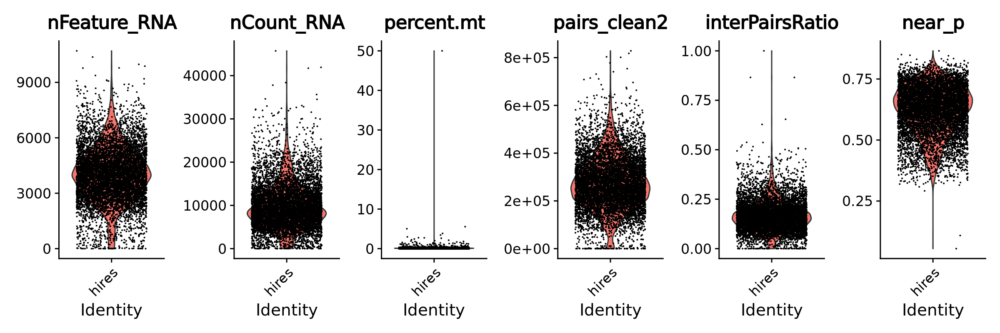

In [ ]:
# 质控指标可视化和细胞过滤处理
# 计算线粒体基因表达百分比作为细胞质量指标
hires[["percent.mt"]] <- PercentageFeatureSet(hires, pattern = "^mt-")
# 设置图形输出参数：宽度12，高度4，分辨率200dpi
options(repr.plot.width=12, repr.plot.height=4,repr.plot.res = 200) 
# 绘制6个质控指标的小提琴图：基因数、RNA计数、线粒体百分比、Hi-C配对数、配对间比率、近距离接触百分比
VlnPlot(hires, features = c("nFeature_RNA", "nCount_RNA", "percent.mt","pairs_clean2","interPairsRatio","near_p"), ncol = 6)
# 设置矩阵显示参数
options(repr.matrix.max.cols=50, repr.matrix.max.rows=10)

# 过滤空细胞和双细胞
# 基于经验判断：RNA计数和Hi-C接触数都约为平均值2倍的细胞可能是双细胞
hires@meta.data %>% filter(!(nCount_RNA > 20000 & pairs_clean2 > 500000) & nCount_RNA > 500)
print("begin subset")
# 应用过滤条件：移除疑似双细胞，保留RNA计数>500且Hi-C配对数>50000的高质量细胞
hires <- subset(hires, subset = !(nCount_RNA > 20000 & pairs_clean2 > 500000) & nCount_RNA > 500 & pairs_clean2 > 50000)

# 使用SCTransform进行数据标准化，采用glmGamPoi方法提高计算效率
hires <- SCTransform(hires,method="glmGamPoi",verbose = FALSE)
# 进行主成分分析(PCA)降维
hires <- RunPCA(hires,verbose = FALSE)

In [ ]:
# 查看Seurat对象的元数据概览
# 显示所有细胞的元数据信息，包括RNA统计、Hi-C特征、细胞周期信息等
hires[[]]

,cellname,orig.ident,nCount_RNA,nFeature_RNA,Rawreads,DNAreads,RNAreads,yperx,raw_pairs,pairs_dedup,pairs_clean1,pairs_clean2,inter_pairs_clean2,UMIs_gene,genes_gene,UMIs_exon,genes_exon,UMIs_gene_genome1,genes_gene_genome1,UMIs_gene_genome2,genes_gene_genome2,10k,1m,200k,20k,50k,RNAreadsRatio,pairsPerRead,pairsValidRatio,interPairsRatio,pairs,pre_meta_score,order_index,near_p,mitotic_p,farAvg,NaganoCellcycle,repli_score,annote_ratio,stage,percent.mt,nCount_SCT,nFeature_SCT
,<chr>,<fct>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<int>
GasaE751001,GasaE751001,hires,11695,5201,0.7889634,0.7041564,0.0732138,0.010131,293142,181153,180220,135168,12777,11695,5201,3310,2121,3676,2162,3449,2017,30.472490,3.83283115,7.9419313,22.3000732,14.9572821,0.09418138,0.1248907,0.4611008,0.09452681,HiC/pairs/GasaE751001.pairs.gz,1.0780520,2599,0.5121117,0.2024793,20006476,G1,0.5857599,0.9945105,E75,0.034202651,9546,4584
GasaE751002,GasaE751002,hires,8408,4085,1.1945130,1.1176506,0.0659949,0.028088,593838,314892,313340,271260,75034,8408,4085,2174,1461,2703,1601,2531,1495,1.111525,0.02596946,0.1688716,0.8885988,0.4802144,0.05575563,0.1593981,0.4567912,0.27661284,HiC/pairs/GasaE751002.pairs.gz,1.2022792,1021,0.6854044,0.1190022,27242188,early/mid-S,0.6183072,0.9952444,E75,0.047573739,8873,4001
GasaE751003,GasaE751003,hires,10863,4722,1.0066968,0.9381633,0.0590820,0.021442,398891,237120,236101,201489,33630,10863,4722,2774,1816,3526,1933,3299,1899,1.399609,0.06301852,0.2480850,1.0964532,0.6234161,0.05924520,0.1275549,0.5051230,0.16690737,HiC/pairs/GasaE751003.pairs.gz,0.9897674,1214,0.7383601,0.1217935,22880310,early/mid-S,0.5489109,0.9945580,E75,0.046027801,9433,4116
GasaE751004,GasaE751004,hires,15596,5575,1.1271210,1.0191219,0.0943068,0.021927,407136,235032,233832,201953,8739,15596,5575,4005,2345,5168,2443,4686,2274,33.335693,6.09475115,11.5011833,25.8493340,19.0115424,0.08469945,0.1198491,0.4960333,0.04327244,HiC/pairs/GasaE751004.pairs.gz,0.9428304,2960,0.6027270,0.3413712,13854623,Pre-M,0.5298337,0.9938649,E75,0.057707104,9568,4662
GasaE751005,GasaE751005,hires,12166,5016,2.8412850,2.6502027,0.1668774,0.023697,1095973,298522,295620,252964,13012,12166,5016,3397,1925,3852,2056,3611,1946,18.157946,2.81364740,5.0977468,13.7097245,9.2115084,0.05923772,0.1240629,0.2308123,0.05143815,HiC/pairs/GasaE751005.pairs.gz,1.3268437,2846,0.4057468,0.2289846,18797081,G1,0.4928112,0.9925780,E75,0.008219628,9555,4455
⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮
OrgeEX053380,OrgeEX053380,hires,9581,3366,2.449614,2.353684,0.0742557,0.007859,541060,305194,303887,271424,55341,9581,3366,1951,1251,3284,1451,3109,1414,0.9415809,0.01987922,0.1039573,0.7024159,0.3415659,0.03058383,0.06896337,0.5016523,0.20389133,HiC/pairs/OrgeEX053380.pairs.gz,1.0726644,198,0.7262033,0.12261368,33596661,early/mid-S,0.5775300,0.9952289,EX05,0.01043732,9126,2968
OrgeEX053381,OrgeEX053381,hires,4856,2485,2.016824,1.961743,0.0384945,0.020611,440947,262534,261214,232481,45535,4856,2485,1036,800,1664,923,1560,917,1.1170235,0.05298748,0.1694761,0.8679079,0.4615517,0.01924497,0.06743192,0.5272312,0.19586547,HiC/pairs/OrgeEX053381.pairs.gz,0.9943043,2576,0.5761287,0.14013533,39136990,G1,0.5212168,0.9937930,EX05,0.04118616,8793,2478
OrgeEX053382,OrgeEX053382,hires,8757,3450,2.242817,2.147959,0.0744111,0.005367,462067,285690,284629,250546,41589,8757,3450,1903,1301,2948,1460,2971,1418,1.4771896,0.01372463,0.1535016,0.9431499,0.4949225,0.03348276,0.06453571,0.5422287,0.16599347,HiC/pairs/OrgeEX053382.pairs.gz,0.9760766,75,0.7336813,0.11057546,32189266,early/mid-S,0.5878601,0.9948912,EX05,0.04567774,9088,3381


In [ ]:
# 读取通过Hi-C聚类质控的细胞名单
# 从外部文件读取经过Hi-C数据质控和聚类分析筛选出的高质量细胞列表
schicluster_qcpass_cellnames <- read_tsv("HiC/schicluster/allqc_p_onlyhicqc_schiclustercellname.txt",col_names = FALSE) %>% pull(X1)

Rows: 7493 Columns: 1
── Column specification ─────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (1): X1

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [ ]:
# 更新并输出最终的质控通过细胞名单
# 从当前Seurat对象中筛选出同时存在于Hi-C质控列表中的细胞
# 保存更新后的细胞名单到新文件，文件名包含日期标识(0414)
hires[[]] %>% 
  filter(cellname %in% schicluster_qcpass_cellnames) %>%    # 只保留Hi-C质控通过的细胞
  select(cellname) %>%                                      # 只选择细胞名称列
  write_tsv("HiC/schicluster/allqc_p_onlyhicqc_schiclustercellname_0414.txt",col_names = FALSE)

In [ ]:
# 根据Hi-C质控名单进一步过滤Seurat对象
# 只保留通过Hi-C聚类质控的高质量细胞，确保后续分析的数据质量
hires <- hires %>% subset(subset = cellname %in% schicluster_qcpass_cellnames)

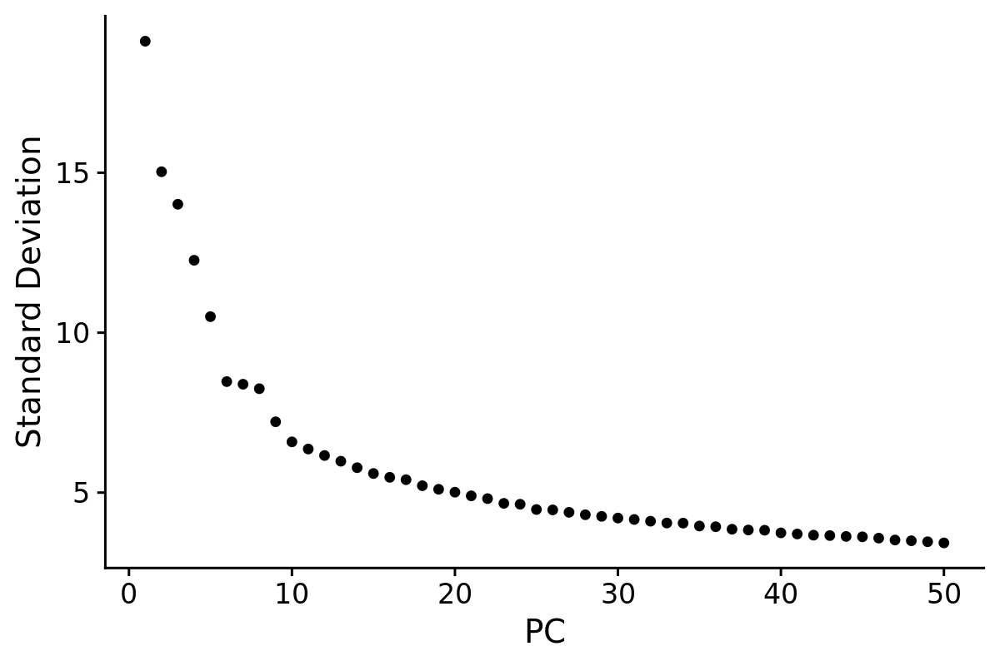

In [ ]:
# 绘制PCA主成分碎石图，用于确定最优主成分数量
# 设置图形参数：宽度6，高度4，分辨率200dpi
options(repr.plot.width=6, repr.plot.height=4,repr.plot.res = 200) 
# 绘制前50个主成分的方差解释度曲线，帮助选择用于下游分析的主成分数量
ElbowPlot(hires,ndims = 50)

In [ ]:
# 进行细胞聚类分析和UMAP非线性降维
# 基于前25个主成分构建细胞间的k近邻图
hires <- FindNeighbors(hires, dims = 1:25,verbose=FALSE)
# 使用Leiden算法进行细胞聚类，分辨率设为1.5(较高分辨率产生更多聚类)
hires <- FindClusters(hires,resolution = 1.5,verbose=FALSE)
# 基于前25个主成分进行UMAP降维，用于细胞的二维可视化
hires <- RunUMAP(hires, dims = 1:25,verbose=FALSE)

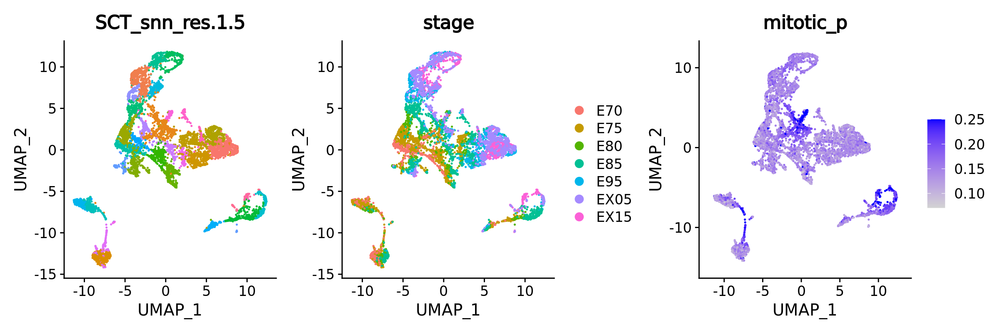

In [ ]:
# 绘制多维度UMAP可视化图
# 设置图形参数：宽度12，高度4，分辨率200dpi
options(repr.plot.width=12, repr.plot.height=4,repr.plot.res=200)

# 并排显示三个UMAP图：
# 1. 按聚类结果着色(不显示图例)
# 2. 按发育阶段着色 
# 3. 显示有丝分裂百分比特征(设置最大值为0.25)
DimPlot(hires, reduction = "umap",group.by="SCT_snn_res.1.5") + NoLegend() | 
DimPlot(hires,group.by = c("stage")) |  
FeaturePlot(hires,features = c("mitotic_p"),max.cutoff = 0.25)

In [ ]:
# 统计各发育阶段的细胞数量分布
# 按stage分组，计算每个发育阶段包含的细胞数量
hires[[]] %>% group_by(stage) %>% summarise(count = n())

stage,count
<chr>,<int>
E70,557
E75,1870
E80,559
E85,1125
E95,1108
EX05,1128
EX15,1122


In [ ]:
# 启用并行计算以加速后续分析
# 加载future包用于并行处理
library(future)
# 设置多进程并行计算，使用40个工作进程
plan("multiprocess", workers = 40)

Warning message:
“Strategy 'multiprocess' is deprecated in future (>= 1.20.0). Instead, explicitly specify either 'multisession' or 'multicore'. In the current R session, 'multiprocess' equals 'multicore'.”


In [44]:
all.markers <- FindAllMarkers(hires)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16

Calculating cluster 17

Calculating cluster 18

Calculating cluster 19

Calculating cluster 20

Calculating cluster 21

Calculating cluster 22

Calculating cluster 23

Calculating cluster 24

Calculating cluster 25

Calculating cluster 26

Calculating cluster 27

Calculating cluster 28

Calculating cluster 29

Calculating cluster 30

Calculating cluster 31

Calculating cluster 32



In [63]:
celltypeAnno <- read_csv("CelltypeAnnotation.txt")
celltypeAnno$SCT_snn_res.1.5 <- factor(celltypeAnno$SCT_snn_res.1.5)

Rows: 33 Columns: 2
── Column specification ─────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: ","
chr (1): celltype
dbl (1): SCT_snn_res.1.5

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [66]:
hires@meta.data <- cbind(hires@reductions$umap@cell.embeddings,hires[[]] %>% left_join(celltypeAnno))#%>% mutate(celltype = ifelse(SCT_snn_res.1 == "19",ifelse(UMAP_2 > -2.5,"myocytes","schwann cell precursors"),celltype))

Joining, by = "SCT_snn_res.1.5"


In [67]:
options(repr.plot.width=8, repr.plot.height=6,repr.plot.res=200)
DimPlot(hires, reduction = "umap",group.by = "celltype",label = T)%>% ggplotly(width = 1200,height = 800)

HTML widgets cannot be represented in plain text (need html)

In [75]:
chrList <- paste0("chr",seq(1:19))
genes <- read_table("~/share/Data/public/ref_genome/mouse_ref/M23/raw_data/gene.bed",col_names = c("chr","start","end","id","name","strand")) %>% group_by(name) %>% slice(1)
#read raw CpG Matrix
raw <- readcolor2("./HiC/color2",chrList) #%>% suppressWarnings()
names(raw) <- names(raw) %>% str_replace_all(".color2","")


── Column specification ─────────────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  chr = col_character(),
  start = col_double(),
  end = col_double(),
  id = col_character(),
  name = col_character(),
  strand = col_character()
)



[1] "Read 100 cells done!"
[1] "Read 200 cells done!"
[1] "Read 300 cells done!"
[1] "Read 400 cells done!"
[1] "Read 500 cells done!"
[1] "Read 600 cells done!"
[1] "Read 700 cells done!"
[1] "Read 800 cells done!"
[1] "Read 900 cells done!"
[1] "Read 1000 cells done!"
[1] "Read 1100 cells done!"
[1] "Read 1200 cells done!"
[1] "Read 1300 cells done!"
[1] "Read 1400 cells done!"
[1] "Read 1500 cells done!"
[1] "Read 1600 cells done!"
[1] "Read 1700 cells done!"
[1] "Read 1800 cells done!"
[1] "Read 1900 cells done!"
[1] "Read 2000 cells done!"
[1] "Read 2100 cells done!"
[1] "Read 2200 cells done!"
[1] "Read 2300 cells done!"
[1] "Read 2400 cells done!"
[1] "Read 2500 cells done!"
[1] "Read 2600 cells done!"
[1] "Read 2700 cells done!"
[1] "Read 2800 cells done!"
[1] "Read 2900 cells done!"
[1] "Read 3000 cells done!"
[1] "Read 3100 cells done!"
[1] "Read 3200 cells done!"
[1] "Read 3300 cells done!"
[1] "Read 3400 cells done!"
[1] "Read 3500 cells done!"
[1] "Read 3600 cells done!"
[

In [77]:
replaceNA <- replaceCpGNA(raw,"~/biosoft/dip-c/color/mm10.cpg.1m.txt")

Warning message:
“`read_table2()` was deprecated in readr 2.0.0.
Please use `read_table()` instead.”

── Column specification ─────────────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  chr = col_character(),
  bin = col_double(),
  cpg = col_double()
)

Joining, by = c("chr", "bin")


In [78]:
RNAcell <- hires@meta.data %>% pull(cellname)
CpGcell <- colnames(replaceNA)[-1][-1]
qcPass <- intersect(RNAcell,CpGcell)
length(RNAcell)
length(qcPass)

[1] 7469

[1] 7469

In [79]:
hires <- subset(hires,subset=cellname %in% qcPass)
cpg <- replaceNA%>% select("chr","bin",all_of(qcPass))
geneNormCpG <- cpg
for (i in 3:length(geneNormCpG)){
    geneNormCpG[i] = rank(geneNormCpG[i])/dim(geneNormCpG)[1] 
} 
genes_cpg_data<-genes %>% mutate(bin = floor(((start+end)/2+500000)/1000000)*1000000) %>% left_join(geneNormCpG) %>% na.omit() %>% select(-start,-end,-chr,-id,-strand,-bin) #%>% mutate(name=paste0("cpg_",name))
head(genes_cpg_data)

Joining, by = c("chr", "bin")


name,GasaE751001,GasaE751002,GasaE751003,GasaE751004,GasaE751005,GasaE751006,GasaE751007,GasaE751008,GasaE751009,GasaE751010,GasaE751011,GasaE751012,GasaE751013,GasaE751014,GasaE751015,GasaE751016,GasaE751017,GasaE751018,GasaE751019,GasaE751020,GasaE751021,GasaE751022,GasaE751023,GasaE751024,⋯,OrgeEX053360,OrgeEX053361,OrgeEX053362,OrgeEX053363,OrgeEX053364,OrgeEX053365,OrgeEX053366,OrgeEX053367,OrgeEX053368,OrgeEX053369,OrgeEX053370,OrgeEX053371,OrgeEX053372,OrgeEX053373,OrgeEX053374,OrgeEX053375,OrgeEX053376,OrgeEX053377,OrgeEX053378,OrgeEX053379,OrgeEX053380,OrgeEX053381,OrgeEX053382,OrgeEX053383,OrgeEX053384
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0610005C13Rik,0.9962841,0.8447564,0.7002477,0.68373245,0.6354253,0.9388935,0.9004955,0.9735756,0.9516928,0.9582989,0.9277457,0.9298101,0.8216350,0.9248555,0.8943022,0.9273328,0.8261767,0.8670520,0.8282411,0.9781173,0.9611891,0.9409579,0.9351775,0.7869529,⋯,0.9640793,0.8571429,0.9682081,0.9372419,0.9723369,0.9533443,0.9669694,0.7919075,0.95334434,0.8699422,0.7881916,0.9880264,0.9549959,0.9463254,0.9595376,0.9624277,0.9516928,0.8876961,0.7229562,0.9083402,0.9421965,0.9145334,0.8831544,0.7976879,0.9124690
0610006L08Rik,0.3707680,0.6147812,0.5429397,0.48059455,0.4186623,0.3918249,0.2691990,0.4327002,0.6056978,0.4021470,0.1218002,0.7060281,0.3517754,0.7155244,0.3315442,0.2489678,0.5887696,0.4636664,0.3191577,0.2456647,0.3526012,0.4962841,0.3843931,0.3649876,⋯,0.3748968,0.9525186,0.6606111,0.4620149,0.6069364,0.4933939,0.4975227,0.8385632,0.51445087,0.3526012,0.5524360,0.4327002,0.5123865,0.4215524,0.5792733,0.5962015,0.4702725,0.6936416,0.6449216,0.3443435,0.5862923,0.5210570,0.4909166,0.0982659,0.4467382
0610009B22Rik,0.8422791,0.8711808,0.8802642,0.80759703,0.8856317,0.8554913,0.8331957,0.9603633,0.8278282,0.8876961,0.9207267,0.7489678,0.8492981,0.5867052,0.8162675,0.8860446,0.8001652,0.8459950,0.6915772,0.8439306,0.8410405,0.9062758,0.7762180,0.9426094,⋯,0.8620974,0.8315442,0.8852188,0.9124690,0.7555739,0.9479769,0.8909992,0.7807597,0.93600330,0.8084228,0.8831544,0.8905863,0.9104046,0.8468208,0.7687861,0.7398844,0.6812552,0.8992568,0.9417836,0.8484723,0.8769612,0.9772915,0.7840628,0.7774566,0.8658134
0610009E02Rik,0.8819158,0.8930636,0.7749794,0.79108175,0.5152766,0.9075145,0.7427746,0.9236168,0.9611891,0.9190751,0.8868704,0.9748142,0.7687861,0.9405450,0.7758051,0.9669694,0.8352601,0.9785301,0.7881916,0.7584641,0.8158547,0.8369116,0.8748968,0.8538398,⋯,0.9108175,0.9760528,0.8720066,0.6606111,0.7588770,0.9942197,0.8736581,0.7361685,0.90049546,0.8678778,0.7316268,0.7464905,0.9682081,0.9091660,0.8315442,0.7993394,0.8340215,0.7522709,0.9430223,0.9265070,0.9521057,0.9393064,0.9058629,0.8484723,0.7679604
0610009L18Rik,0.9021470,0.9971098,0.9987614,0.99545830,0.9975227,0.9971098,0.9966969,0.9744013,0.9966969,0.9979356,0.9921552,0.9797688,0.9987614,0.9818332,0.9896780,0.9867878,0.9933939,0.9925681,0.9500413,0.9434352,0.9991742,0.9830718,0.9706854,1.0000000,⋯,0.9855491,0.9872007,0.9946325,0.9905037,0.9979356,0.8414533,0.8959538,0.9987614,0.99752271,0.9905037,0.9896780,0.9966969,0.9917424,0.9421965,0.9876135,0.9500413,0.9128819,0.9710983,0.9405450,0.9971098,0.9979356,0.9533443,0.9991742,0.9888522,0.9843105
0610010F05Rik,0.1998348,0.3042940,0.1399670,0.09867878,0.2093311,0.4549959,0.4174236,0.4079273,0.4834847,0.3067713,0.1924030,0.1564822,0.3761354,0.2072667,0.1102395,0.3290669,0.2295623,0.3794385,0.4682081,0.4578860,0.3257638,0.0957886,0.3674649,0.3063584,⋯,0.3270025,0.1692816,0.2130471,0.4203138,0.6804294,0.4054500,0.4719240,0.1994220,0.06193229,0.2886045,0.3142031,0.3224608,0.5355078,0.4368291,0.5000000,0.2679604,0.5305533,0.4653179,0.2947977,0.1890999,0.1742362,0.7320396,0.3501239,0.4401321,0.4029727


In [83]:
#createSeuratAssays
cpg_assay <- CreateAssayObject(cpg %>% unite("feature",c("chr","bin")) %>% column_to_rownames("feature"))
genes_cpg_assay <- CreateAssayObject(genes_cpg_data %>% column_to_rownames("name"))

hires[["cpg"]] <- cpg_assay
hires[["cpggene"]] <- genes_cpg_assay

DefaultAssay(hires) <- "cpg"
#Rank Normalize for CpG
dfOmit <- hires[['cpg']]@data%>% as.data.frame
for (i in 1:length(dfOmit)){
    dfOmit[i] = rank(dfOmit[i])/dim(dfOmit)[1] 
}
hires[['cpg']]@data <- as(dfOmit%>% as.matrix, "sparseMatrix") 

all.bins <- rownames(hires)
#cpg_obj <- NormalizeData(cpg_obj,normalization.method = "LogNormalize",scale.factor=100000)
#cpg_obj <- FindVariableFeatures(cpg_obj, selection.method = "vst", nfeatures = 2500)

#cpg_obj <- ScaleData(cpg_obj, features = all.bins,vars.to.regress = c("nearp"))
hires <- ScaleData(hires, features = all.bins,do.scale = F,do.center = T)
# if set do.scale and do.center to FALSE,
# function scale data will make scale.data identicle with data

#Setting center to TRUE will center the expression for each feature by subtracting the average expression for that feature. Setting scale to TRUE will 
#scale the expression level for each feature by dividing the centered feature expression levels by 
#their standard deviations if center is TRUE and by their root mean square otherwise.

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Centering data matrix



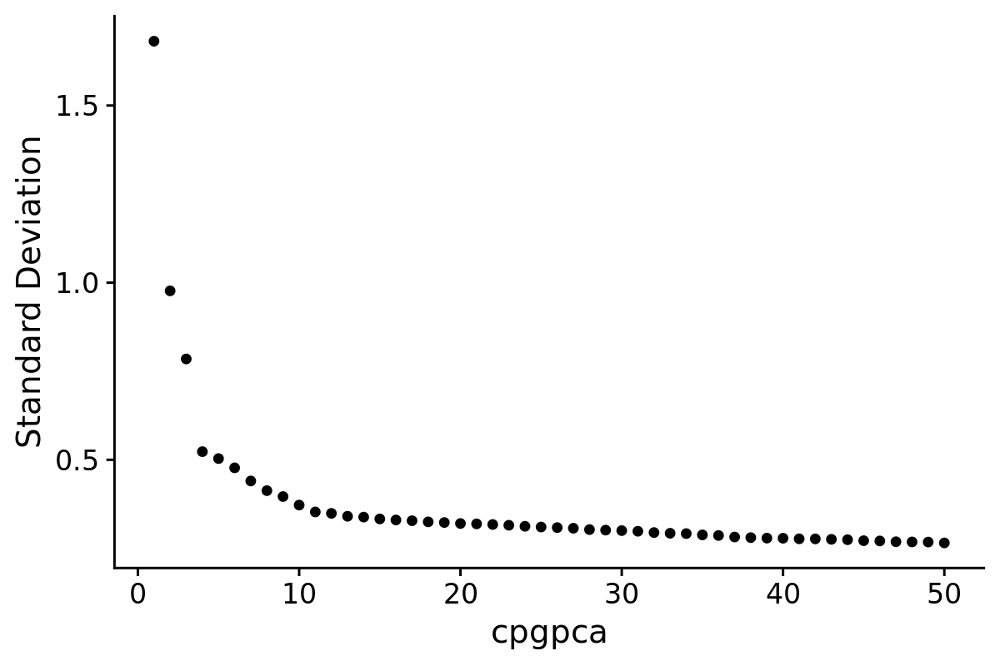

In [81]:
hires <- RunPCA(hires, features = all.bins,verbose = FALSE,npcs = 100,reduction.name = "cpgpca",reduction.key = "cpgpca_")
options(repr.plot.width=6, repr.plot.height=4,repr.plot.res=200)
ElbowPlot(hires,ndims = 50,reduction = "cpgpca")

In [84]:
hires <- RunUMAP(hires, dims =1:20,verbose=FALSE,reduction = "cpgpca",reduction.name = "cpgumap", reduction.key='cpgumap_')

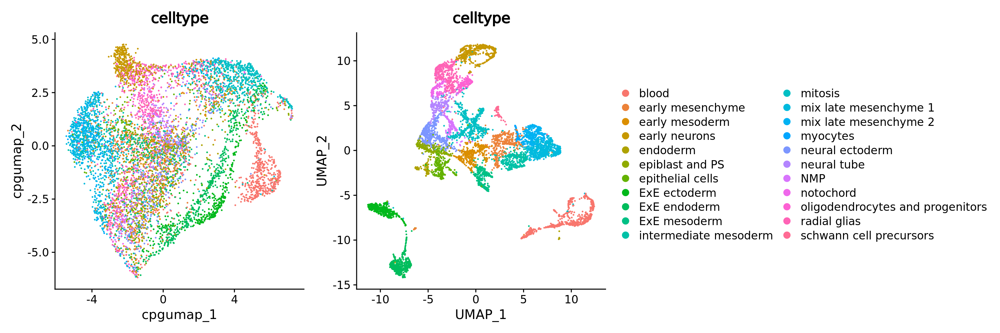

In [85]:
options(repr.plot.width=15, repr.plot.height=5,repr.plot.res=200)
DimPlot(hires,label=F,reduction = "cpgumap",group.by = "celltype")  + NoLegend() | DimPlot(hires,label=F,reduction = "umap",group.by = "celltype") #| DimPlot(hires,label=F,reduction = "umap",group.by = "stage") 

## Add contact decay profile (cdps) to current object

In [124]:
mat <- read_tsv("cdps.tsv")
mat <- mat[,45:138]
mat <- mat[,rev(names(mat))]
rownames(mat) <- hires[[]] %>% pull(cellname)

Rows: 7469 Columns: 151
── Column specification ─────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
dbl (151): 0.0, 1000.0, 1090.5077326652577, 1189.2071150027211, 1296.8395546...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Warning message:
“Setting row names on a tibble is deprecated.”


In [125]:
# add cdps to object
hires_cdps <- CreateAssayObject(t(mat))
hires[["cdps"]] <- hires_cdps
DefaultAssay(hires) <- "cdps"
hires <- hires %>% ScaleData() %>%  RunPCA(verbose = FALSE,features = rownames(hires[["cdps"]]),npcs = 20,reduction.name = "cdpspca",reduction.key = "cdpspca_")

Centering and scaling data matrix



In [126]:
hires <- FindNeighbors(hires,graph.name = "cdps_nn",reduction="cdpspca",dims=1:6)
hires <- FindClusters(hires,resolution=1,graph.name = "cdps_nn",algorithm = 3)

Computing nearest neighbor graph

Computing SNN

Only one graph name supplied, storing nearest-neighbor graph only



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 7469
Number of edges: 70659

Running smart local moving algorithm...
Maximum modularity in 10 random starts: 0.8138
Number of communities: 16
Elapsed time: 1 seconds


Warning message:
“UNRELIABLE VALUE: One of the ‘future.apply’ iterations (‘future_lapply-1’) unexpectedly generated random numbers without declaring so. There is a risk that those random numbers are not statistically sound and the overall results might be invalid. To fix this, specify 'future.seed=TRUE'. This ensures that proper, parallel-safe random numbers are produced via the L'Ecuyer-CMRG method. To disable this check, use 'future.seed = NULL', or set option 'future.rng.onMisuse' to "ignore".”


In [127]:
options(future.seed=TRUE)
hires <- RunUMAP(hires, dims =1:4,verbose=FALSE,reduction = "cdpspca",reduction.name = "cdpsumap", reduction.key='cdpsumap_')

## Add schicluster svd embedding to current object

In [90]:
cellnames <- read_tsv("HiC/schicluster/allqc_p_onlyhicqc_schiclustercellname_0414.txt",col_names = "cellname")

Rows: 7469 Columns: 1
── Column specification ─────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (1): cellname

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [93]:
sch_embedding <- rhdf5::h5read("./HiC/schicluster/imputed_matrix/100kb_resolution/merged/embed/pad1_std1_rp0.5_sqrtvc.svd20.hdf5","data")
sch_embedding <- t(sch_embedding)
rownames(sch_embedding) <- colnames(hires)
hires[["schicluster"]] <- CreateDimReducObject(embedding= sch_embedding,assay="cpg",key="SCHICLUSTER_")

Warning message:
“No columnames present in cell embeddings, setting to 'SCHICLUSTER_1:20'”


In [95]:
hires <- FindNeighbors(hires,reduction = "schicluster",dims = 1:15,graph.name = "sch.nn")
hires <- FindClusters(hires,graph.name = "sch.nn",future.seed=TRUE)

Computing nearest neighbor graph

Computing SNN

Only one graph name supplied, storing nearest-neighbor graph only

Warning message:
“The following arguments are not used: future.seed”
Warning message:
“The following arguments are not used: future.seed”


Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 7469
Number of edges: 69725

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8061
Number of communities: 15
Elapsed time: 0 seconds


3 singletons identified. 12 final clusters.

Warning message:
“UNRELIABLE VALUE: One of the ‘future.apply’ iterations (‘future_lapply-1’) unexpectedly generated random numbers without declaring so. There is a risk that those random numbers are not statistically sound and the overall results might be invalid. To fix this, specify 'future.seed=TRUE'. This ensures that proper, parallel-safe random numbers are produced via the L'Ecuyer-CMRG method. To disable this check, use 'future.seed = NULL', or set option 'future.rng.onMisuse' to "ignore".”


In [104]:
options(future.seed=TRUE)
hires <- RunUMAP(hires,reduction = "schicluster",dims = 1:15,reduction.name = "schiclusterumap",reduction.key='schiclusterumap_',verbose=FALSE)

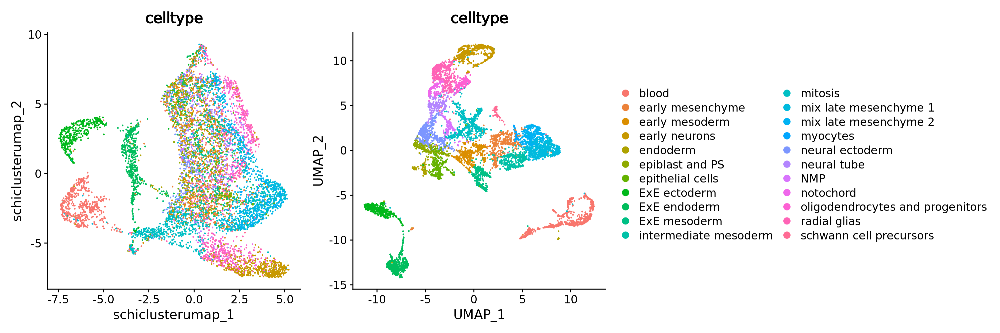

In [105]:
options(repr.plot.width=15, repr.plot.height=5,repr.plot.res=200)
DimPlot(hires,label=F,reduction = "schiclusterumap",group.by = "celltype")  + NoLegend() | DimPlot(hires,label=F,reduction = "umap",group.by = "celltype") #| DimPlot(hires,label=F,reduction = "umap",group.by = "stage") 

## RNA cell cycle scores

In [117]:
DefaultAssay(hires) <- "SCT"
# Add cellcycle genes to metadata
s.genes <- cc.genes$s.genes
g2m.genes <- cc.genes$g2m.genes
DefaultAssay(hires) <- "SCT"
hires <- CellCycleScoring(hires, s.features = s.genes, g2m.features = g2m.genes)

hires <-AddModuleScore(hires,features = list(CC.Score= c(cc.genes$s.genes,cc.genes$g2m.genes)))

Warning message:
“The following features are not present in the object: MCM5, PCNA, TYMS, FEN1, MCM2, MCM4, RRM1, UNG, GINS2, MCM6, CDCA7, DTL, PRIM1, UHRF1, MLF1IP, HELLS, RFC2, RPA2, NASP, RAD51AP1, GMNN, WDR76, SLBP, CCNE2, UBR7, POLD3, MSH2, ATAD2, RAD51, RRM2, CDC45, CDC6, EXO1, TIPIN, DSCC1, BLM, CASP8AP2, USP1, CLSPN, POLA1, CHAF1B, BRIP1, E2F8, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: HMGB2, CDK1, NUSAP1, UBE2C, BIRC5, TPX2, TOP2A, NDC80, CKS2, NUF2, CKS1B, MKI67, TMPO, CENPF, TACC3, FAM64A, SMC4, CCNB2, CKAP2L, CKAP2, AURKB, BUB1, KIF11, ANP32E, TUBB4B, GTSE1, KIF20B, HJURP, CDCA3, HN1, CDC20, TTK, CDC25C, KIF2C, RANGAP1, NCAPD2, DLGAP5, CDCA2, CDCA8, ECT2, KIF23, HMMR, AURKA, PSRC1, ANLN, LBR, CKAP5, CENPE, CTCF, NEK2, G2E3, GAS2L3, CBX5, CENPA, not searching for symbol synonyms”
Warning message in AddModuleScore(object = object, features = features, name = name, :
“Could not find enough features in the object 

In [120]:
names(hires@meta.data)[56] <- "CC.Score"
names(hires@meta.data)[53] <- "G1S.Score"

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



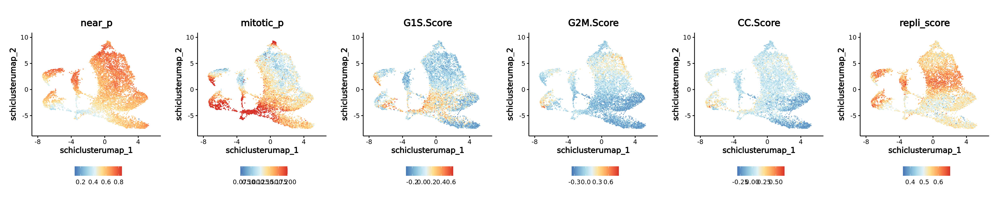

In [121]:
colors <-c('#d73027','#f46d43','#fdae61','#fee090','#e0f3f8','#abd9e9','#74add1','#4575b4')

options(repr.plot.width=25, repr.plot.height=5,repr.plot.res=200)
a<-FeaturePlot(hires,reduction = "schiclusterumap", features = "near_p")+ scale_color_gradientn(colors=rev(colors)) + theme_Publication()
b<-FeaturePlot(hires,reduction = "schiclusterumap", features = "mitotic_p",max.cutoff = 0.2) + scale_color_gradientn(colors=rev(colors)) + theme_Publication()
c<-FeaturePlot(hires,reduction = "schiclusterumap", features = "G1S.Score") + scale_color_gradientn(colors=rev(colors)) + theme_Publication()
d<-FeaturePlot(hires,reduction = "schiclusterumap", features = "G2M.Score") + scale_color_gradientn(colors=rev(colors)) + theme_Publication()
e<-FeaturePlot(hires,reduction = "schiclusterumap", features = "CC.Score") + scale_color_gradientn(colors=rev(colors)) + theme_Publication()
f<-FeaturePlot(hires,reduction = "schiclusterumap", features = "repli_score") + scale_color_gradientn(colors=rev(colors)) + theme_Publication()
a|b|c|d|e|f

In [ ]:
hires %>% saveRDS("hires_mouse_emb_dev.mres.rds")

In [ ]:
hires[[]]%>% write_tsv("metadata_qcpass.tsv")